In [1]:
import matplotlib
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import os
import umap
import datashader as ds
import colorcet as cc
import igraph
import tqdm
from scipy import sparse
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import KMeans
from scipy.spatial import Delaunay

from matplotlib.collections import PolyCollection
from matplotlib.colors import ListedColormap

from dredFISH.Analysis import TissueGraph
from dredFISH.Visualization import Viz
from dredFISH.Utils.__init__plots import * 
from dredFISH.Utils import powerplots
from dredFISH.Utils import miscu
from dredFISH.Utils import tmgu

import importlib
importlib.reload(Viz)
importlib.reload(TissueGraph)

<module 'dredFISH.Analysis.TissueGraph' from '/bigstore/GeneralStorage/fangming/projects/dredfish/packages/dredFISH/dredFISH/Analysis/TissueGraph.py'>

#### Load data

In [2]:
respath = '/bigstore/GeneralStorage/fangming/projects/dredfish/figures/'

In [3]:
basepth = '/bigstore/GeneralStorage/Data/dredFISH/Dataset1-t5'
!ls -alhtr $basepth
!head $basepth"/TMG.json"

total 85M
drwxrwxrwx 9 zach     wollmanlab 4.0K Jul 20 10:38 ..
lrwxrwxrwx 1 fangming wollmanlab   67 Jul 20 10:38 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_matrix.csv -> ../Dataset1-t4/DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_matrix.csv
lrwxrwxrwx 1 fangming wollmanlab   69 Jul 20 10:38 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_metadata.csv -> ../Dataset1-t4/DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_metadata.csv
-rw-r--r-- 1 fangming wollmanlab   32 Jul 20 10:39 README.txt
-rw-r--r-- 1 fangming wollmanlab   88 Jul 20 10:41 TMG.json
-rw-r--r-- 1 fangming wollmanlab  53M Jul 20 10:41 cell.h5ad
drwxr-xr-x 3 fangming wollmanlab 4.0K Jul 20 10:45 .
-rw-r--r-- 1 fangming wollmanlab  32M Jul 20 10:45 default_analysis.csv
drwxr-xr-x 4 fangming wollmanlab 4.0K Jul 21 11:49 figures
{"layers_graph": [], "layer_taxonomy_mapping": {}, "Taxonomies": [], "Layers": ["cell"]}

In [4]:
df = pd.read_csv(
    os.path.join(basepth, "default_analysis.csv"), index_col=0)
df

,x,y,x2,y2,hemi,b0,b1,b2,b3,b4,...,type_r0.01,type_r0.02,type_r0.05,type_r0.1,type_r0.2,type_r0.5,type_r1,type_r2,type_r5,type_r10
0,1911.666962,-1749.638192,1833.366541,-1831.521636,1,-0.603849,1.714861,0.594060,0.139496,1.509942,...,t1,t1,t1,t3,t2,t4,t3,t16,t47,t40
1,1850.678429,-1747.172043,1772.544083,-1826.392145,1,-0.530279,1.681959,1.301185,-0.464006,1.570054,...,t1,t1,t1,t3,t2,t4,t3,t16,t47,t40
2,1515.123295,-1746.940031,1437.319766,-1811.493848,1,-0.603849,-0.362498,0.620053,-1.128423,1.206578,...,t1,t1,t1,t3,t2,t10,t9,t20,t24,t66
3,1426.161788,-1748.456394,1348.376999,-1809.120415,1,-0.298989,1.023065,1.517082,-0.341796,0.475449,...,t1,t1,t1,t3,t2,t10,t9,t20,t51,t121
4,1739.792930,-1749.407386,1661.666850,-1823.778747,1,-0.603849,-1.351786,1.025515,-1.128423,0.327118,...,t1,t1,t1,t1,t1,t1,t2,t3,t34,t21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77841,-2188.756848,-1084.480934,-2234.065840,-987.777939,0,-0.603849,-0.271399,-0.666686,0.269214,0.821624,...,t1,t1,t1,t3,t2,t8,t18,t36,t56,t57
77842,-2257.822983,-1083.270665,-2303.013073,-983.550072,0,0.936062,0.386319,-0.614982,1.752306,0.067531,...,t1,t1,t3,t4,t6,t8,t10,t6,t1,t73
77843,-2475.320577,-1083.995803,-2520.334508,-974.768090,0,-0.603849,-0.228163,-0.612215,0.895132,0.247026,...,t1,t1,t2,t2,t5,t6,t7,t25,t41,t82
77844,-2311.578984,-1086.717336,-2356.868349,-984.643871,0,-0.603849,-1.153599,0.699586,-0.204732,1.546018,...,t1,t1,t1,t1,t1,t1,t1,t5,t12,t26


In [5]:
TMG = TissueGraph.TissueMultiGraph(basepath=basepth, 
                                   redo=False, # load existing 
                                  )

/bigstore/GeneralStorage/Data/dredFISH/Dataset1-t5/cell.h5ad


In [6]:
# spatial coordinates
layer = TMG.Layers[0]
XY = layer.XY
x, y = XY[:,0], XY[:,1]
###
x, y = y, x # a temporary hack
###

cells = layer.adata.obs.index.values

N = layer.N
# measured basis
ftrs_mat = layer.feature_mat

# umap_mat = umap.UMAP(n_neighbors=30, min_dist=0.1).fit_transform(ftrs_mat)



In [7]:
# types
typecol = 'type_r0.1'
types = df[typecol].values
# local env
# env_mat = get_local_typeabundance(layer.SG, types)

In [8]:
dd = Delaunay(XY)

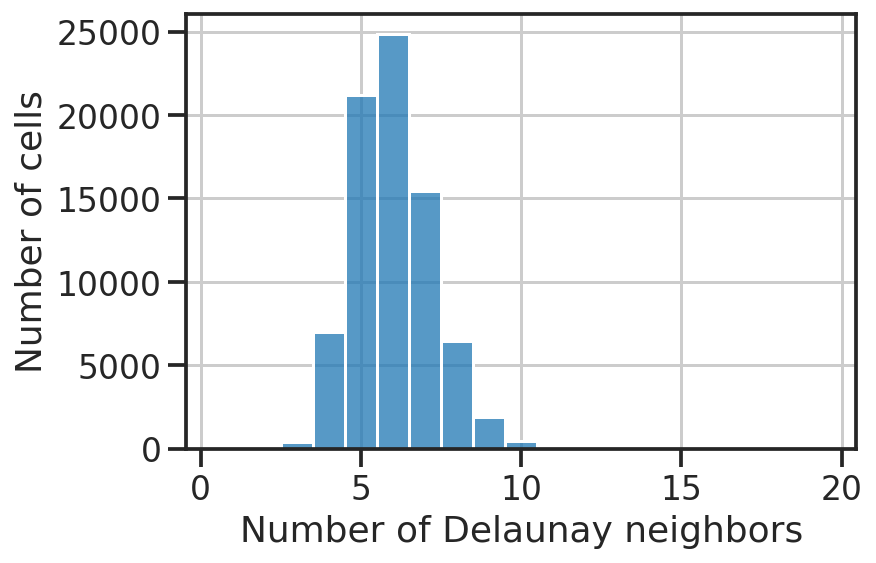

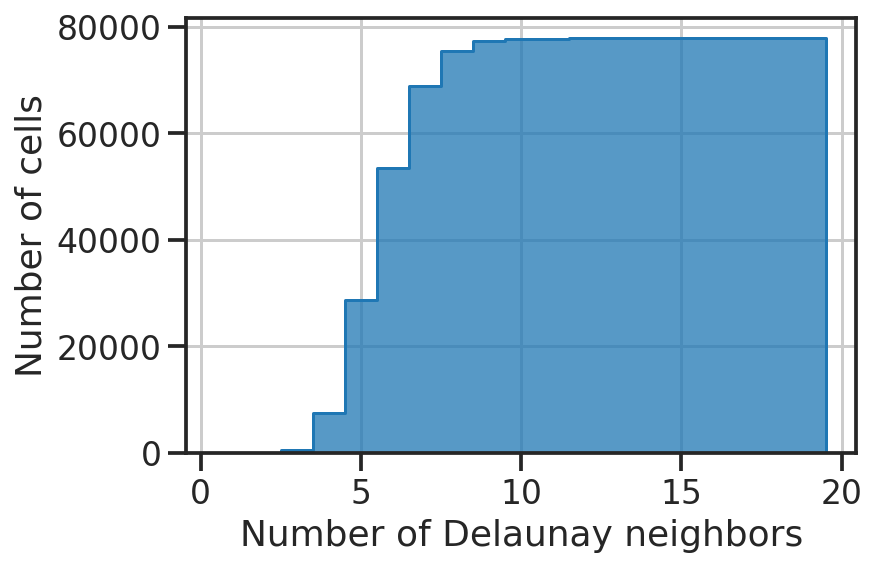

In [9]:
dgr = layer.SG.indegree() # same as out
fig, ax = plt.subplots()
sns.histplot(data=dgr, element='bars', bins=np.arange(0.5, 20), ax=ax)
ax.set_xlabel('Number of Delaunay neighbors')
ax.set_ylabel('Number of cells')
plt.show()

dgr = layer.SG.indegree() # same as out
fig, ax = plt.subplots()
sns.histplot(data=dgr, element='step', bins=np.arange(0.5, 20), ax=ax, cumulative=True)
ax.set_xlabel('Number of Delaunay neighbors')
ax.set_ylabel('Number of cells')
plt.show()

In [10]:
# distance to DD neighbors?
# adj_mtx = SG.get_adjacency_sparse()
EL = np.asarray(layer.SG.get_edgelist())
EL.shape

(233471, 2)

In [11]:
XY[EL].shape

(233471, 2, 2)

In [12]:
dists = np.linalg.norm(XY[EL][:,0,:] - XY[EL][:,1,:], ord=2, axis=1)

In [13]:
EL.shape, dists.reshape(-1,1).shape

((233471, 2), (233471, 1))

In [14]:
# tmp = pd.DataFrame(np.hstack([EL, dists.reshape(-1,1)]))
# tmp
N = len(XY)

# duplicate
tmp = pd.DataFrame()
tmp[0] = np.hstack([EL[:,0], EL[:,1]])
# tmp[1] = np.hstack([EL[:,1], EL[:,0]])
tmp[2] = np.hstack([dists,dists])

meandists = tmp.groupby(0).mean().reindex(np.arange(N))[2].values 
meandists

array([22.75935667, 30.24087094, 23.47344503, ..., 37.55824862,
       32.08524035, 26.97662798])

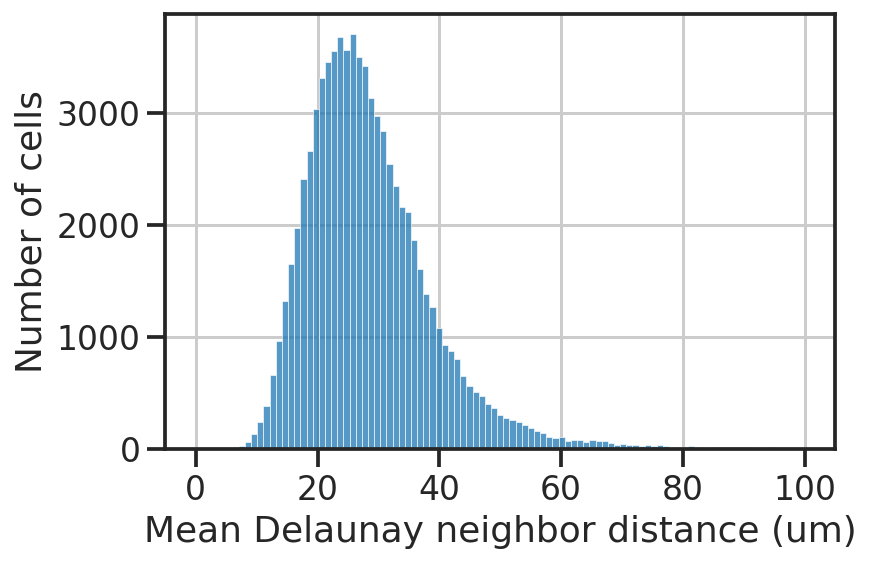

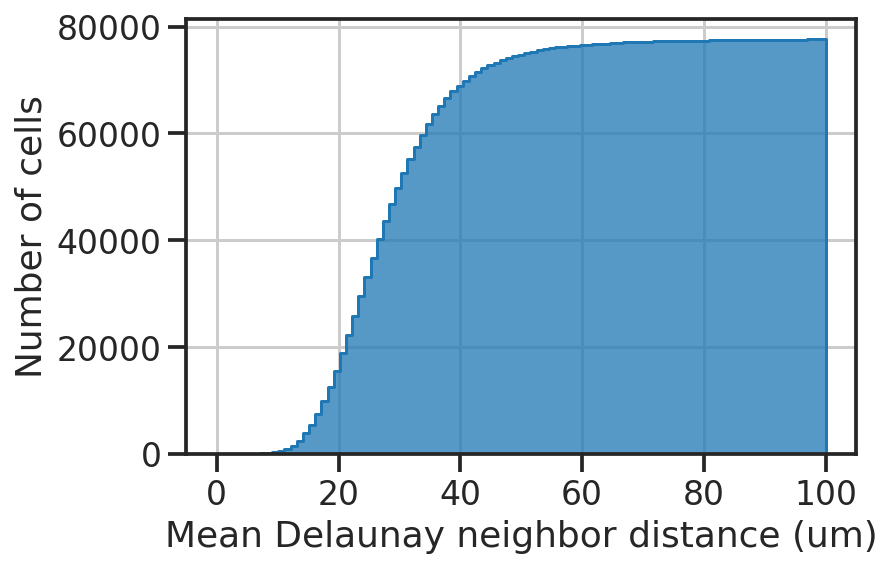

In [15]:
# dgr = layer.SG.indegree() # same as out
fig, ax = plt.subplots()
sns.histplot(data=meandists, element='bars', 
             bins=np.linspace(0,100,100), 
             ax=ax)
ax.set_xlabel('Mean Delaunay neighbor distance (um)')
ax.set_ylabel('Number of cells')
plt.show()

dgr = layer.SG.indegree() # same as out
fig, ax = plt.subplots()
sns.histplot(data=meandists, element='step', 
             bins=np.linspace(0,100,100), 
             # bins=np.arange(0.5, 20), 
             cumulative=True,
             ax=ax, 
             )
ax.set_xlabel('Mean Delaunay neighbor distance (um)')
ax.set_ylabel('Number of cells')
plt.show()

In [16]:
# spatial distribution of Delaunay neighbors
# number of neighbors
# distances

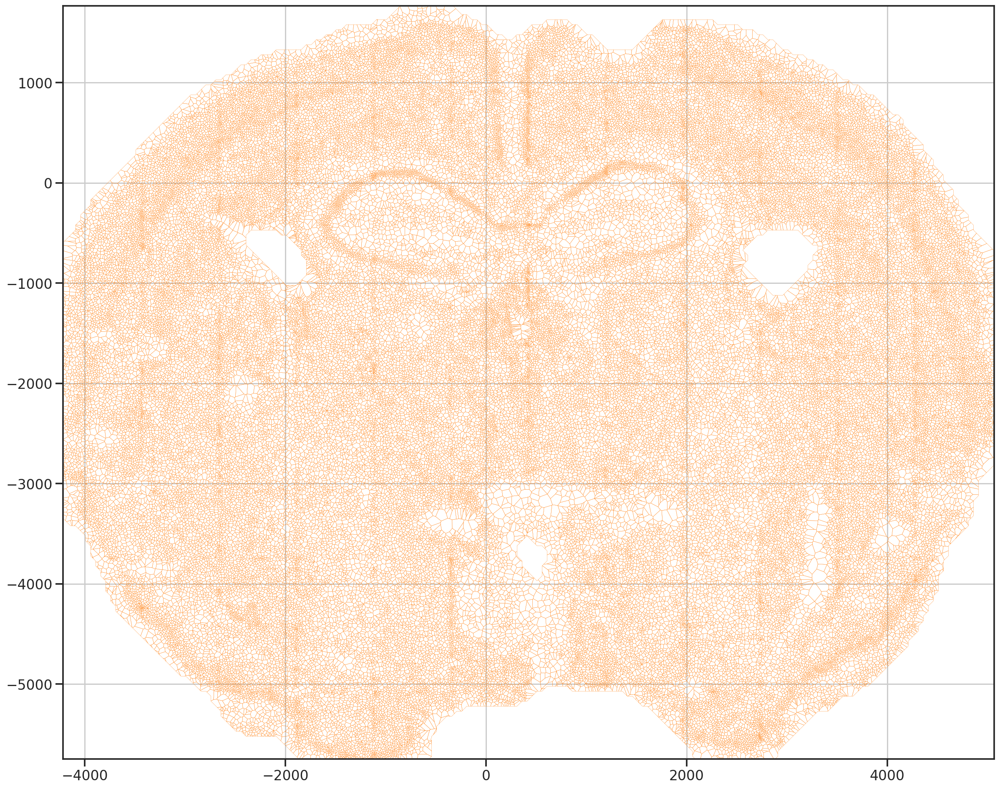

In [17]:
polys = XY[dd.convex_hull]
polys2 = TMG.Geoms[0]['poly'] #) #) #[0]

xcoords = polys[:,:,0]
xmin, xmax = np.min(xcoords), np.max(xcoords)
ycoords = polys[:,:,1]
ymin, ymax = np.min(ycoords), np.max(ycoords)

fig, ax = plt.subplots(figsize=(20,20))
p2 = LineCollection(polys2, color='C1', linewidth=0.2, cmap='viridis')
p2.set_array(layer.SG.indegree())
ax.add_collection(p2)
ax.set_aspect('equal') #, 'box')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
plt.show()

/tmp/ipykernel_2075453/2388484919.py:19: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, shrink=0.3, label="Num Delaunay neighbors")


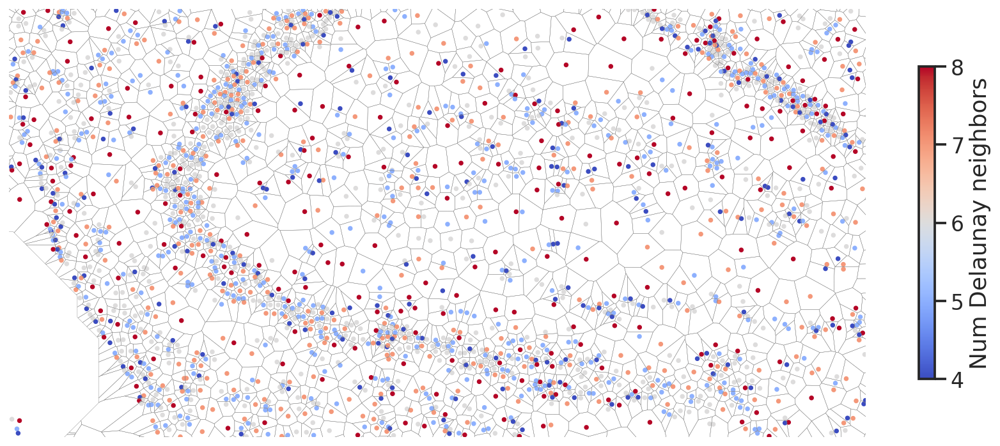

In [18]:
xmin, xmax = -2000, 0
ymin, ymax = -1000, 0
cond = ((XY[:,0] > xmin)
    * (XY[:,0] < xmax)
    * (XY[:,1] > ymin)
    * (XY[:,1] < ymax)
)
nk = np.array(layer.SG.indegree())

fig, ax = plt.subplots(figsize=(15,15))
p2 = LineCollection(polys2, color='gray', linewidth=0.2)#, cmap='viridis')
p2.set_array(layer.SG.indegree())
ax.add_collection(p2)
g = ax.scatter(XY[cond,0], XY[cond,1], c=nk[cond], s=5, cmap='coolwarm', vmin=4, vmax=8)
ax.set_aspect('equal') #, 'box')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.axis('off')
fig.colorbar(g, shrink=0.3, label="Num Delaunay neighbors")
plt.show()

/tmp/ipykernel_2075453/1667627300.py:18: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, shrink=0.3, label="Num Delaunay neighbors")


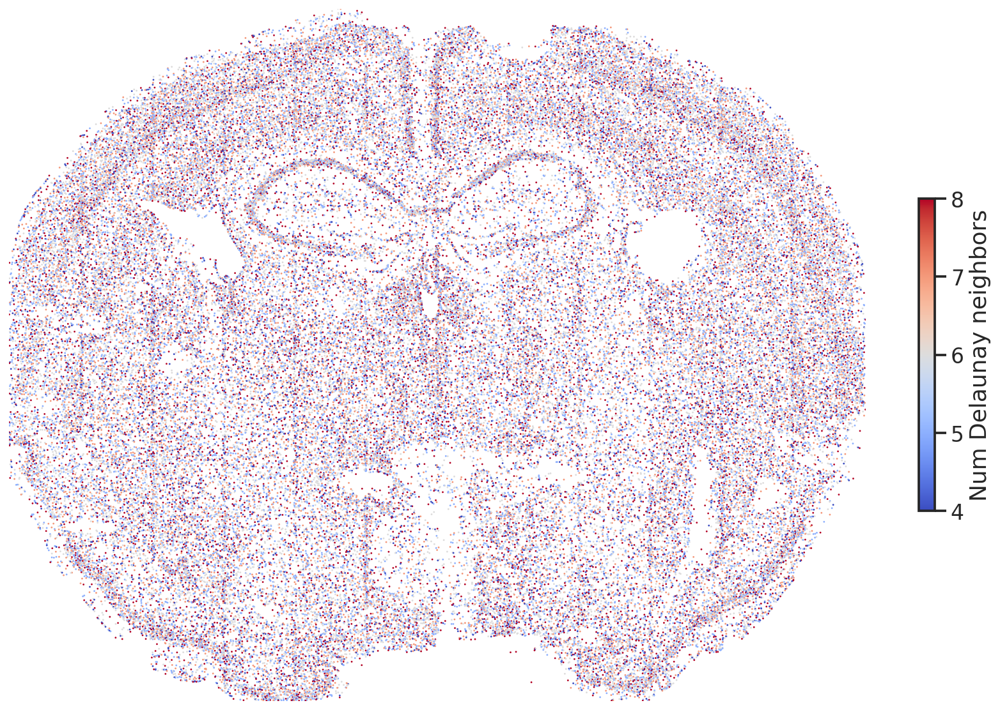

In [19]:
xcoords = polys[:,:,0]
xmin, xmax = np.min(xcoords), np.max(xcoords)
ycoords = polys[:,:,1]
ymin, ymax = np.min(ycoords), np.max(ycoords)

cond = np.arange(N)
nk = np.array(layer.SG.indegree())

fig, ax = plt.subplots(figsize=(15,15))
# p2 = LineCollection(polys2, color='gray', linewidth=0.2)#, cmap='viridis')
# p2.set_array(layer.SG.indegree())
# ax.add_collection(p2)
g = ax.scatter(XY[cond,0], XY[cond,1], c=nk[cond], s=2, cmap='coolwarm', vmin=4, vmax=8, edgecolor='none')
ax.set_aspect('equal') #, 'box')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.axis('off')
fig.colorbar(g, shrink=0.3, label="Num Delaunay neighbors")
plt.show()

/tmp/ipykernel_2075453/1315802725.py:20: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, shrink=0.3, label="Mean dist. to Delauney neighbors")


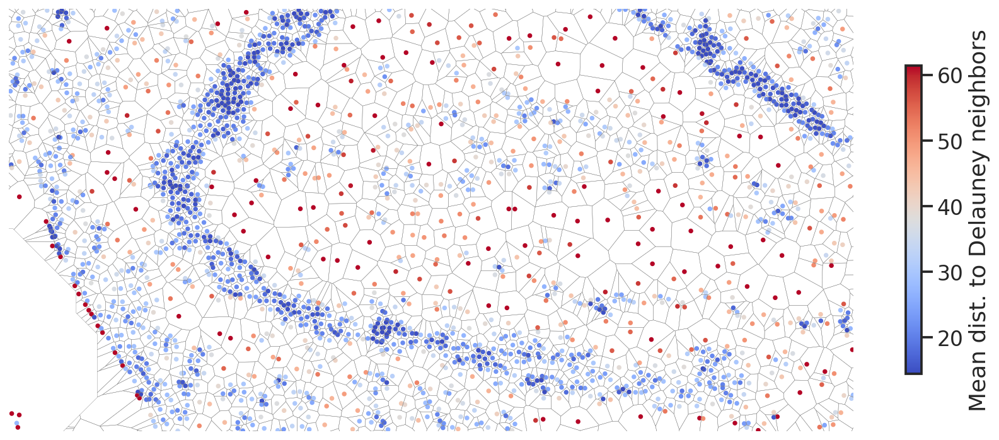

In [20]:
xmin, xmax = -2000, 0
ymin, ymax = -1000, 0
cond = ((XY[:,0] > xmin)
    * (XY[:,0] < xmax)
    * (XY[:,1] > ymin)
    * (XY[:,1] < ymax)
)
hue = meandists[cond]
vmin, vmax = np.percentile(hue, 5), np.percentile(hue, 95)

fig, ax = plt.subplots(figsize=(15,15))
p2 = LineCollection(polys2, color='gray', linewidth=0.2)#, cmap='viridis')
p2.set_array(layer.SG.indegree())
ax.add_collection(p2)
g = ax.scatter(XY[cond,0], XY[cond,1], c=hue, s=5, cmap='coolwarm', vmin=vmin, vmax=vmax)
ax.set_aspect('equal') #, 'box')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.axis('off')
fig.colorbar(g, shrink=0.3, label="Mean dist. to Delauney neighbors")
plt.show()

/tmp/ipykernel_2075453/1086855388.py:16: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, shrink=0.3, label="Mean dist. to Delauney neighbors")


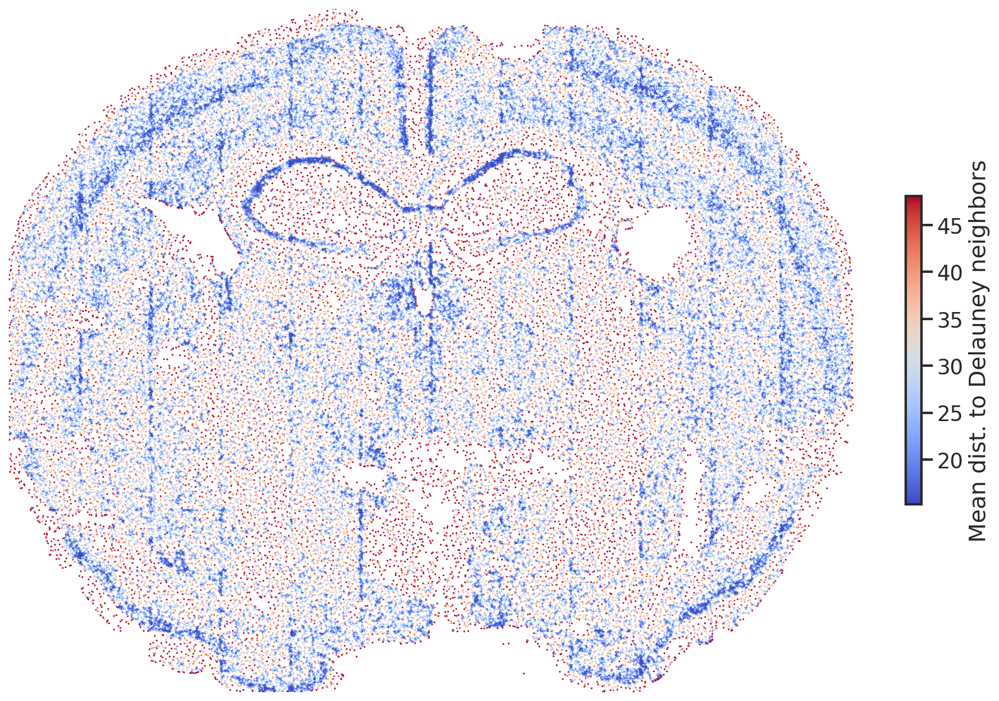

In [21]:
xcoords = polys[:,:,0]
xmin, xmax = np.min(xcoords), np.max(xcoords)
ycoords = polys[:,:,1]
ymin, ymax = np.min(ycoords), np.max(ycoords)

cond = np.arange(N)
hue = meandists[cond]
vmin, vmax = np.percentile(hue, 5), np.percentile(hue, 95)

fig, ax = plt.subplots(figsize=(15,15))
g = ax.scatter(XY[cond,0], XY[cond,1], c=hue, s=2, cmap='coolwarm', edgecolor='none', vmin=vmin, vmax=vmax)
ax.set_aspect('equal') #, 'box')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.axis('off')
fig.colorbar(g, shrink=0.3, label="Mean dist. to Delauney neighbors")
plt.show()

In [22]:
typecol = 'type_r0.1'
types = df[typecol]
unq_types = np.unique(types)

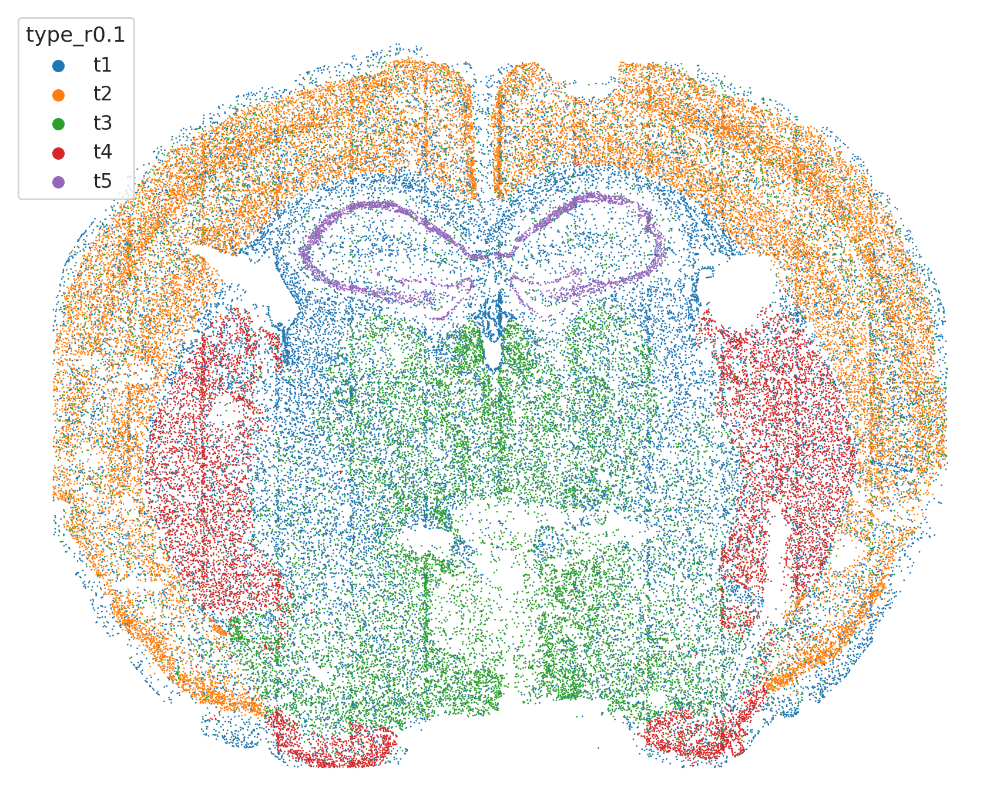

In [23]:
fig, ax = plt.subplots(figsize=(15,15))
sns.scatterplot(data=df, x='x', y='y', hue=typecol, hue_order=unq_types, ax=ax, edgecolor='none', s=2)
# g = ax.scatter(XY[cond,0], XY[cond,1], c=hue, s=2, cmap='coolwarm', vmin=vmin, vmax=vmax)
ax.set_aspect('equal') #, 'box')
ax.axis('off')
# fig.colorbar(g, shrink=0.3, label="Mean dist. to Delauney neighbors")
plt.show()

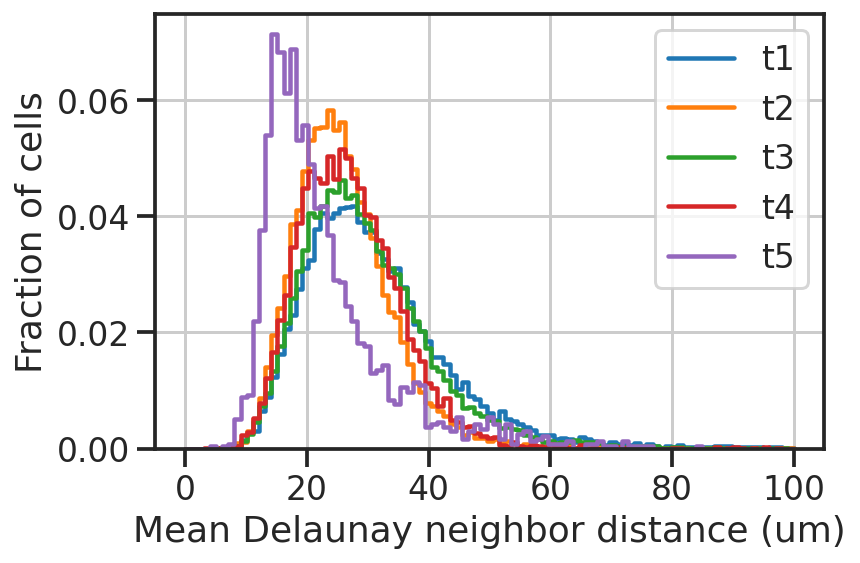

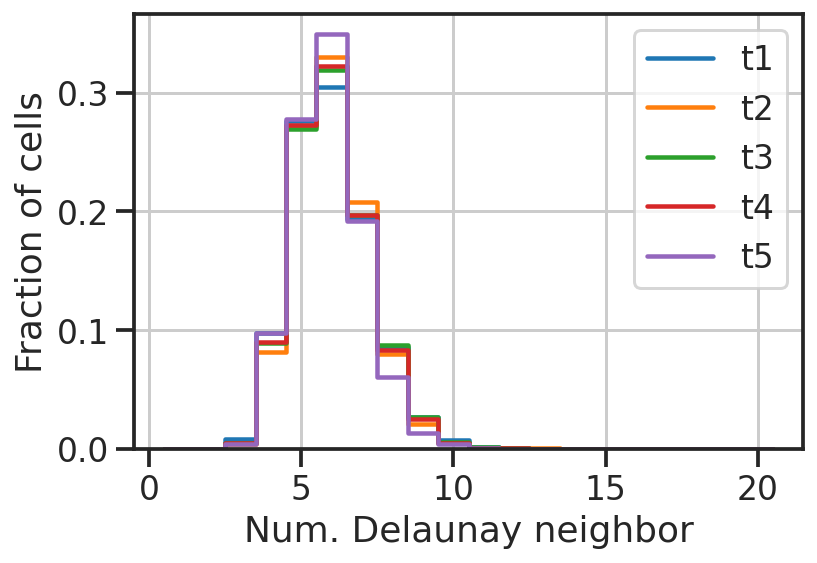

In [24]:
# by cell type
unq_types = np.unique(types)
colors = sns.color_palette("tab10", len(unq_types))
nk = np.array(layer.SG.indegree())

fig, ax = plt.subplots()
for i, t in enumerate(unq_types):
    val = meandists[types==t]
    sns.histplot(data=val, element='step', stat='probability',
                 fill=False,
                 label=t,
                 bins=np.linspace(0,100,100), 
                 color=colors[i],
                 ax=ax)
ax.legend()
ax.set_xlabel('Mean Delaunay neighbor distance (um)')
ax.set_ylabel('Fraction of cells')
plt.show()

fig, ax = plt.subplots()
for i, t in enumerate(unq_types):
    val = nk[types==t]
    sns.histplot(data=val, element='step', stat='probability',
                 fill=False,
                 label=t,
                 bins=np.arange(0.5, 21), 
                 color=colors[i],
                 ax=ax)
ax.legend()
ax.set_ylabel('Fraction of cells')
ax.set_xlabel('Num. Delaunay neighbor')
plt.show()

In [25]:
typecols = df.filter(regex='^type_|^ktype_', axis=1).columns
typecols

Index(['ktype_L1', 'ktype_L2', 'ktype_L3', 'type_r0.01', 'type_r0.02',
       'type_r0.05', 'type_r0.1', 'type_r0.2', 'type_r0.5', 'type_r1',
       'type_r2', 'type_r5', 'type_r10'],
      dtype='object')

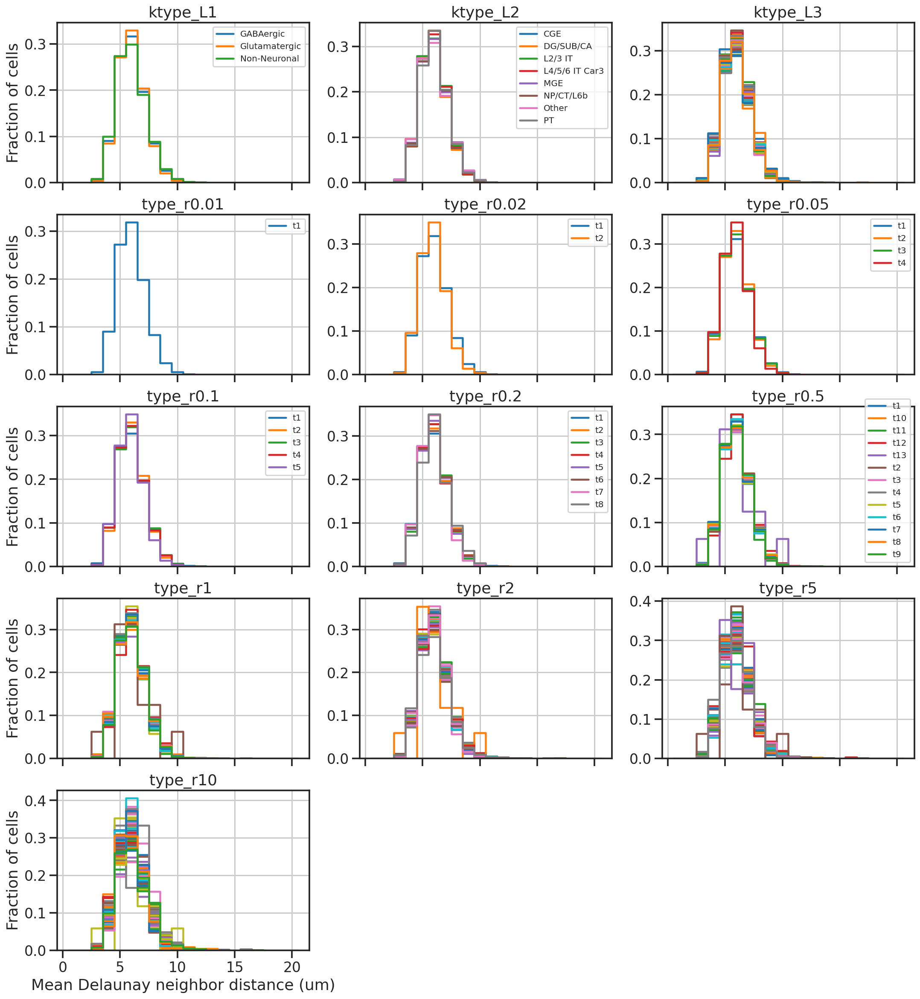

In [26]:
nk = np.array(layer.SG.indegree())

n = len(typecols)
nx = 3
ny = int((n+nx-1)/nx) 

fig, axs = plt.subplots(ny, nx, figsize=(6*nx, 4*ny), sharex=True)
for j, (typecol, ax) in enumerate(zip(typecols, axs.flat)):
    types = df[typecol].values
    # by cell type
    unq_types = np.unique(types)
    colors = sns.color_palette("tab10", len(unq_types))

    for i, t in enumerate(unq_types):
        val = nk[types==t]
        sns.histplot(data=val, element='step', stat='probability',
                     fill=False,
                     label=t,
                     bins=np.arange(0.5, 21), 
                     color=colors[i],
                     ax=ax)
    if len(unq_types) < 15:
        ax.legend(fontsize=10)
    else:
        pass
    
    ax.set_title(typecol)
    if j % nx == 0:
        ax.set_xlabel('Mean Delaunay neighbor distance (um)')
        ax.set_ylabel('Fraction of cells')
    else:
        ax.set_xlabel('')
        ax.set_ylabel('')
        
for ax in axs.flat[j+1:]:
    ax.axis('off')
plt.show()

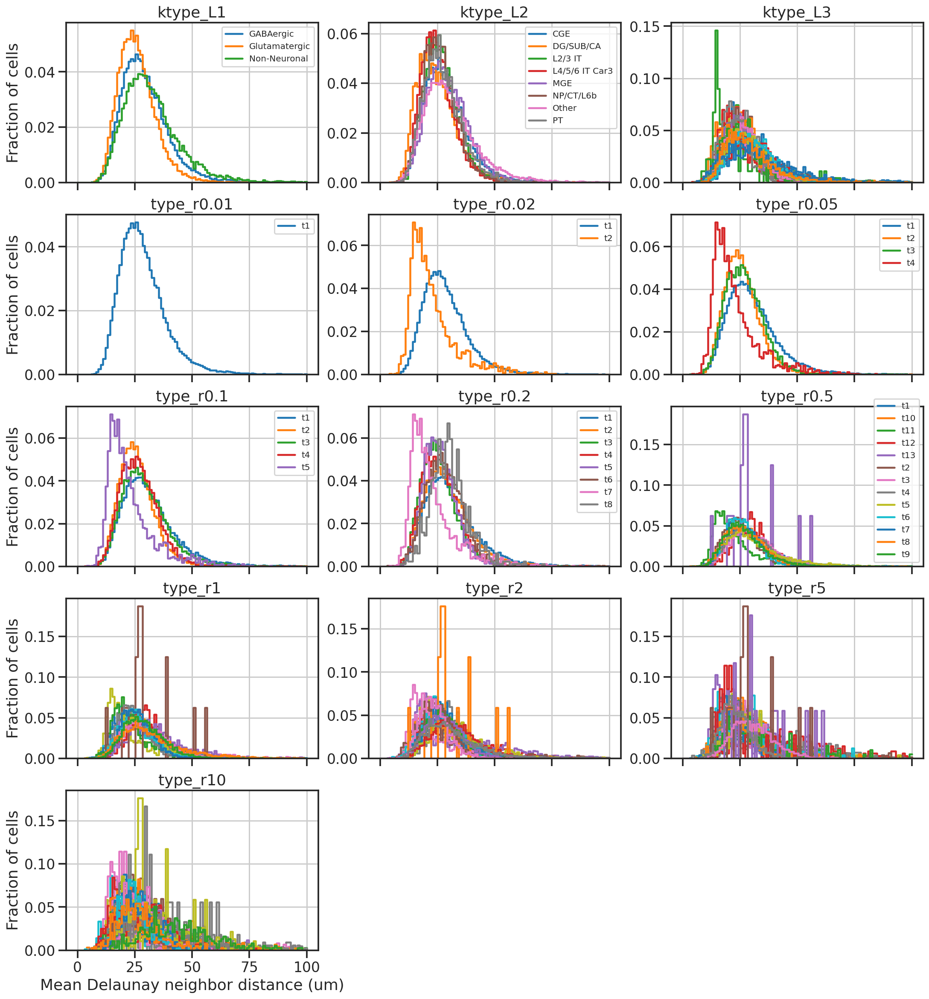

In [27]:
nk = np.array(layer.SG.indegree())

n = len(typecols)
nx = 3
ny = int((n+nx-1)/nx) 

fig, axs = plt.subplots(ny, nx, figsize=(6*nx, 4*ny), sharex=True)
for j, (typecol, ax) in enumerate(zip(typecols, axs.flat)):
    types = df[typecol].values
    # by cell type
    unq_types = np.unique(types)
    colors = sns.color_palette("tab10", len(unq_types))

    for i, t in enumerate(unq_types):
        val = meandists[types==t]
        sns.histplot(data=val, element='step', stat='probability',
                     fill=False,
                     label=t,
                     bins=np.linspace(0,100,100), 
                     color=colors[i],
                     ax=ax)
    if len(unq_types) < 15:
        ax.legend(fontsize=10)
    else:
        pass
    
    ax.set_title(typecol)
    if j % nx == 0:
        ax.set_xlabel('Mean Delaunay neighbor distance (um)')
        ax.set_ylabel('Fraction of cells')
    else:
        ax.set_xlabel('')
        ax.set_ylabel('')
        
for ax in axs.flat[j+1:]:
    ax.axis('off')
plt.show()

# Allen cell types only

In [28]:
typemap = df[['ktype_L3', 'ktype_L2']].groupby('ktype_L3').first()['ktype_L2']
typemap

ktype_L3
Astro                       Other
CA1-ProS                DG/SUB/CA
CA2-IG-FC               DG/SUB/CA
CA3                     DG/SUB/CA
CR                          Other
CT SUB                  NP/CT/L6b
Car3               L4/5/6 IT Car3
DG                      DG/SUB/CA
Endo                        Other
L2 IT ENTl                L2/3 IT
L2 IT ENTm                L2/3 IT
L2/3 IT CTX               L2/3 IT
L2/3 IT ENTl              L2/3 IT
L2/3 IT PPP               L2/3 IT
L2/3 IT RHP               L2/3 IT
L3 IT ENT                 L2/3 IT
L4 RSP-ACA                     PT
L4/5 IT CTX        L4/5/6 IT Car3
L5 IT CTX          L4/5/6 IT Car3
L5 PPP                         PT
L5 PT CTX                      PT
L5/6 IT TPE-ENT    L4/5/6 IT Car3
L5/6 NP CTX             NP/CT/L6b
L6 CT CTX               NP/CT/L6b
L6 IT CTX          L4/5/6 IT Car3
L6 IT ENTl         L4/5/6 IT Car3
L6b CTX                 NP/CT/L6b
L6b/CT ENT              NP/CT/L6b
Lamp5                         CGE
Meis2

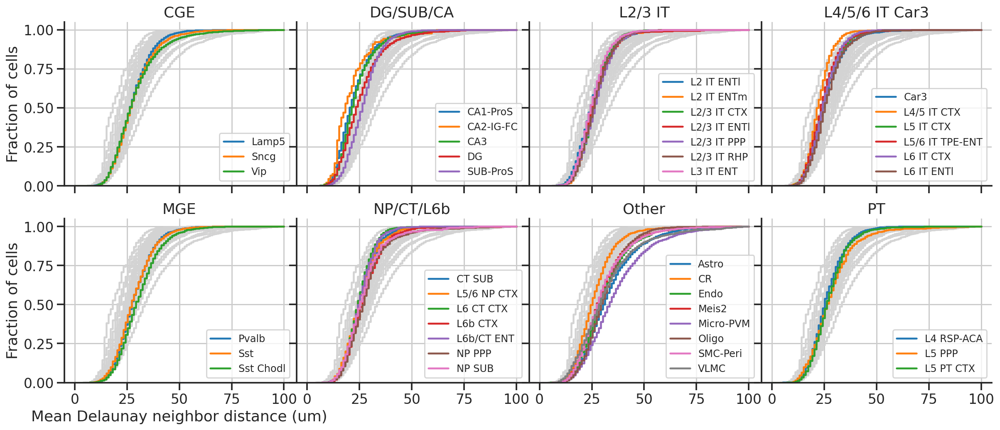

In [29]:
types = df['ktype_L3'].values
unq_types = np.sort(np.unique(types))

major_types = np.sort(np.unique(typemap))
nx = 4
ny = 2
fig, axs = plt.subplots(ny, nx, figsize=(nx*5, ny*4), sharex=True, sharey=True)
for j, major_type in enumerate(major_types):
    ax = axs.flat[j]
    minor_types = typemap[typemap==major_type].index
    ax.set_title(major_type)
    for t in unq_types:
        val = meandists[types==t]
        sns.histplot(data=val, element='step', stat='probability',
                     fill=False,
                     label='',
                     bins=np.linspace(0,100,100), 
                     color='lightgray',
                     cumulative=True,
                     ax=ax)
    for i, t in enumerate(minor_types):
        val = meandists[types==t]
        sns.histplot(data=val, element='step', stat='probability',
                     fill=False,
                     label=t,
                     bins=np.linspace(0,100,100), 
                     color=colors[i],
                     cumulative=True,
                     ax=ax)
    ax.legend(fontsize=12)
    sns.despine(ax=ax)
    if j % nx == 0:
        ax.set_xlabel('Mean Delaunay neighbor distance (um)')
        ax.set_ylabel('Fraction of cells')
    else:
        ax.set_xlabel('')
        ax.set_ylabel('')
fig.subplots_adjust(wspace=0.01)
plt.show()
        

# Denov cell types only

In [30]:
typemap = df[['type_r1', 'type_r0.1']].groupby('type_r1').first()['type_r0.1']
types = df['type_r1'].values
unq_types = np.sort(np.unique(types))
major_types = np.sort(np.unique(typemap))
typemap

type_r1
t1     t1
t10    t4
t11    t1
t12    t2
t13    t1
t14    t3
t15    t3
t16    t2
t17    t5
t18    t1
t19    t1
t2     t1
t20    t2
t21    t2
t22    t1
t23    t4
t3     t3
t4     t2
t5     t4
t6     t2
t7     t2
t8     t3
t9     t3
Name: type_r0.1, dtype: object

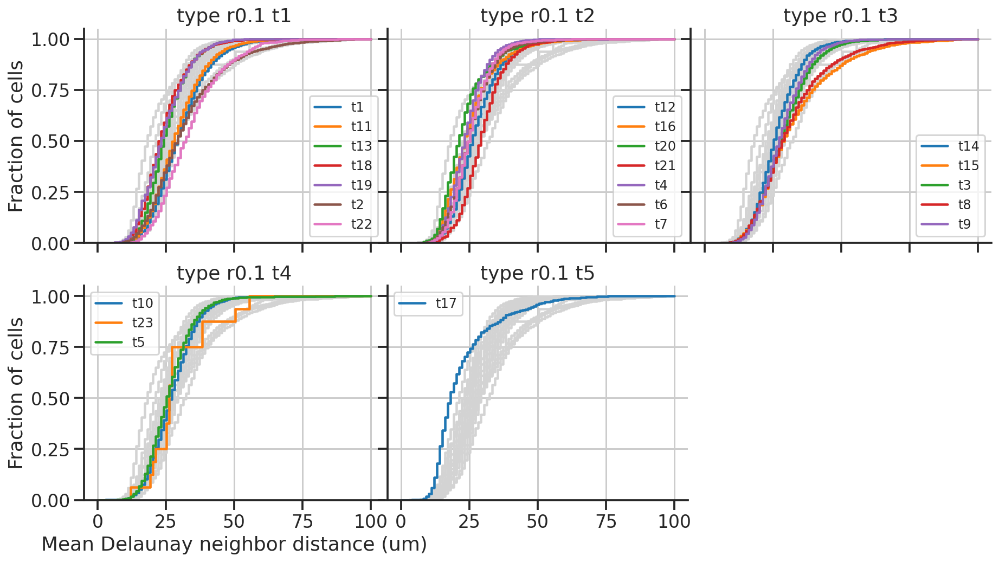

In [32]:
nx = 3
ny = 2
fig, axs = plt.subplots(ny, nx, figsize=(nx*5, ny*4), sharex=True, sharey=True)
for j, major_type in enumerate(major_types):
    ax = axs.flat[j]
    minor_types = typemap[typemap==major_type].index.values
    ax.set_title("type r0.1 "+major_type)
    for t in unq_types:
        val = meandists[types==t]
        sns.histplot(data=val, element='step', stat='probability',
                     fill=False,
                     label='',
                     bins=np.linspace(0,100,100), 
                     color='lightgray',
                     cumulative=True,
                     ax=ax)
    for i, t in enumerate(minor_types):
        val = meandists[types==t]
        sns.histplot(data=val, element='step', stat='probability',
                     fill=False,
                     label=t,
                     bins=np.linspace(0,100,100), 
                     color=colors[i],
                     cumulative=True,
                     ax=ax)
    ax.legend(fontsize=12)
    sns.despine(ax=ax)
    if j % nx == 0:
        ax.set_xlabel('Mean Delaunay neighbor distance (um)')
        ax.set_ylabel('Fraction of cells')
    else:
        ax.set_xlabel('')
        ax.set_ylabel('')
fig.subplots_adjust(wspace=0.01)
for ax in axs.flat[j+1:]:
    ax.axis('off')
plt.show()
        